# Astrazeneca Coding Challenge

**Author:** [Sepehr Janghorbani](https://www.janghorbani.com/)

**In this notebook I design and develop a model for retinal fundus image clasification.**



**Dataset Selection**
**For this challenge, I choose the public dataset for [Aptos 2019-blindness-detection kaggle challenge](https://www.kaggle.com/competitions/aptos2019-blindness-detection/overview). The dataset is one of the most famous benchmarks for retina classification models and the license is for public use. Furthermore, it is ideal for this challenge since it has sufficient number of samples to demonstrate model performance and also reasonable number of classes to predict.**

**The version of the packages for reproducability purposes is also attached to the file.**


## Import the Data
**The first step before training the model is to import the data. I have already downloaded the data from [here](https://www.kaggle.com/competitions/aptos2019-blindness-detection/data).**

**First of all I will perform some exploratory data analysis to get a grasp of structure underlying the dataset.
I used google GPU cluster for this notebook and the dataset was uploaded to the corresponding connected hard drive.**

In [1]:
file_dir = "/common/home/sj620/AZChallenge/aptos2019-blindness-detection/dataset_images/"


## Exploratory Data Analysis


**In this section, I will perform exploratory data analysis to better grasp the structure of the data. Although the original dataset has a test split,  the test data in  the provided link does not have labels and therefore cannot be used for evaluation. As a result we will need to create a held-out split ourselves. We take ~20% of the data as hel-out test and leave the rest for training and validation in order to leave enough number of samples both in training and test splits.**


In [3]:
from skimage import io, color
import os
import cv2
import pandas as pd
import numpy as np
import random
import torch

print(torch.cuda.is_available())


file_names = os.listdir(file_dir)
labels_df = pd.read_csv(file_dir+'../labels.csv')
images,labels = [],[]

#setting random seed for reproducibility
SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)

# Reading images and labels
for i,file in enumerate(file_names):
    if(i%200==0):
        print(i)
        
    if(file == '.DS_Store'):
        continue
        
    images.append(io.imread(file_dir+file))

    labels.append(labels_df.loc[labels_df['id_code'] == file.split('.')[0]]['diagnosis'].item())



True
0
200
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400
2600
2800
3000
3200
3400
3600


**First let's qualitatively look at some samples of the training split.**

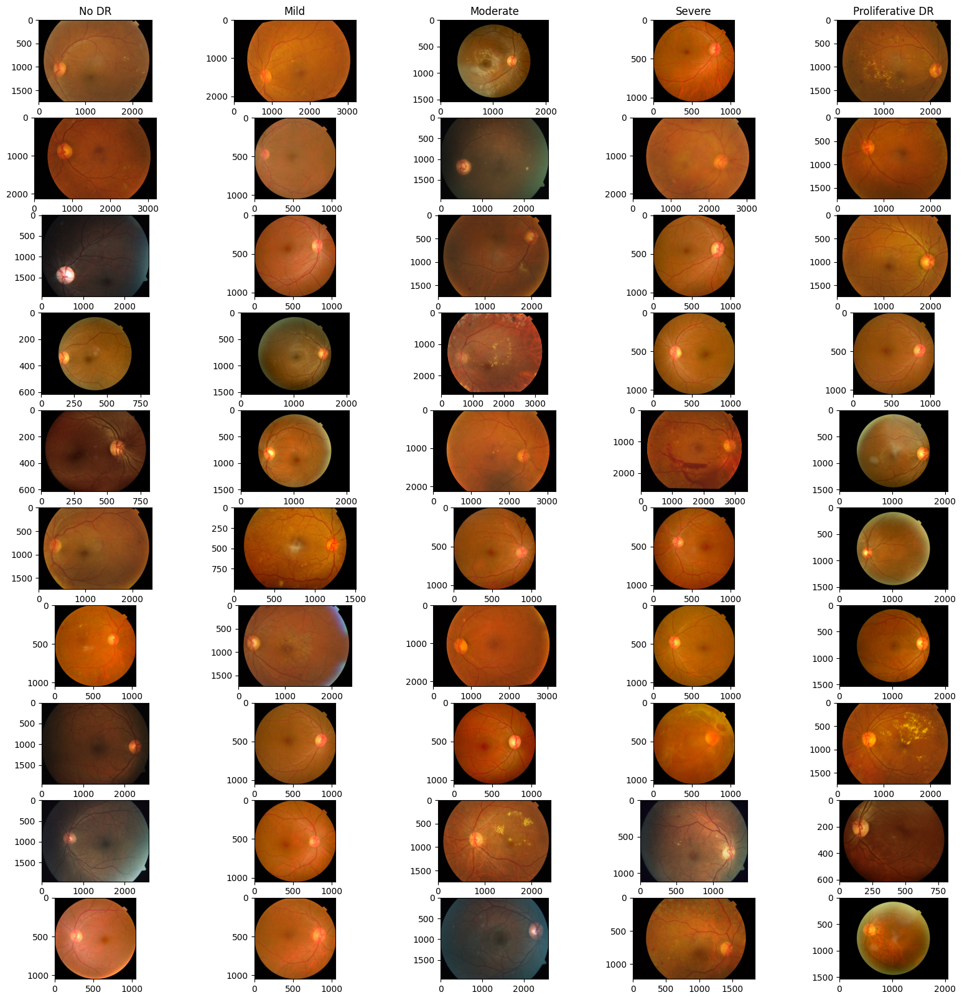

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

SEED = 42
np.random.seed(SEED)
random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
CLASS_NAMES = {0: "No DR",1: "Mild", 2: "Moderate", 3:"Severe", 4: "Proliferative DR"}
NO_CLASSES=5 

# showing num_samples samples randomly
def show_samples(images,labels,num_samples):
    
    random.seed(SEED)
    
    fig, axarr = plt.subplots(num_samples,NO_CLASSES)
    fig.set_size_inches(20, 20)
    
    for i in range(NO_CLASSES):

        indices = [j for j, x in enumerate(labels) if x == i]
        samples = random.sample(range(len(indices)), num_samples)
        axarr[0,i].set_title(CLASS_NAMES[i])

        for j in range(len(samples)):
            axarr[j,i].imshow(images[samples[j]])
            axarr[j,i].imshow(images[samples[j]])
            axarr[j,i].imshow(images[samples[j]])
            axarr[j,i].imshow(images[samples[j]])

show_samples(images,labels,10)


**As we can see images in this dataset are not normalized in terms of size or brightness and there is vast variablity in terms of size and brightness for different images. let's look at the size distribution of dataset more deeply.**

<Axes: ylabel='Count'>

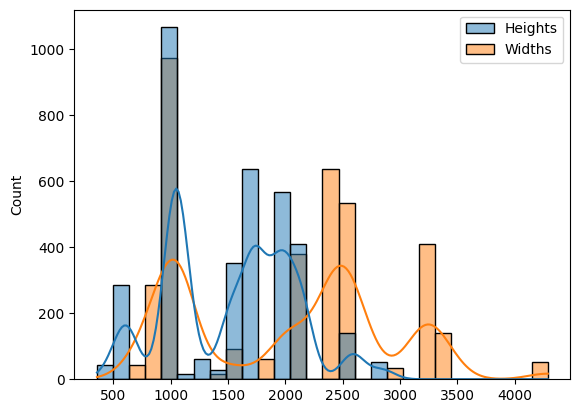

In [5]:
f,axes = plt.subplots(1,1)

# histogram plot of image weights and heights
heights,widths = [],[]
for i in range(len(images)):
    heights.append(images[i].shape[0])
    widths.append(images[i].shape[1])
    
heights_df = pd.Series(heights, name = "Heights")
widths_df = pd.Series(widths, name = "Widths")
sizes_df = pd.concat([heights_df, widths_df],axis=1)


sns.histplot(data = sizes_df, kde = True, ax=axes)


**As we can see images have differnt sizes so inorder to normalize images we will resize them to 300x300 inorder to both nromalize images and also make it computationally efficient for the model to learn.**


In [6]:
# Resizing images to 300x300

IMG_SIZE = 300

images_resized = []
for image in images:
    images_resized.append(cv2.resize(image, (IMG_SIZE, IMG_SIZE)))

images_resized = np.stack(images_resized, axis=3)
images_resized = np.transpose(images_resized,(3,0,1,2))
labels_np = np.array(labels)


**As discussed before we will split the data into train and test and analyze the class label distribution in train and test splits. Roughly 20% of the dataset is used as held-out test
In addition, let's also look at the label distribution of the dataset wrt to different classes. As we can see there is some  data class imbalance in all the splits as shown in the pie charts. Most of the data corresponds to "NoDR" label while "Severe cases" are much less frequent. 
We will use this distribution for oversampling less frequent classes in the next sections to improve model performance.**

disease
0          1469
2           819
1           298
4           248
3           166
Name: count, dtype: int64


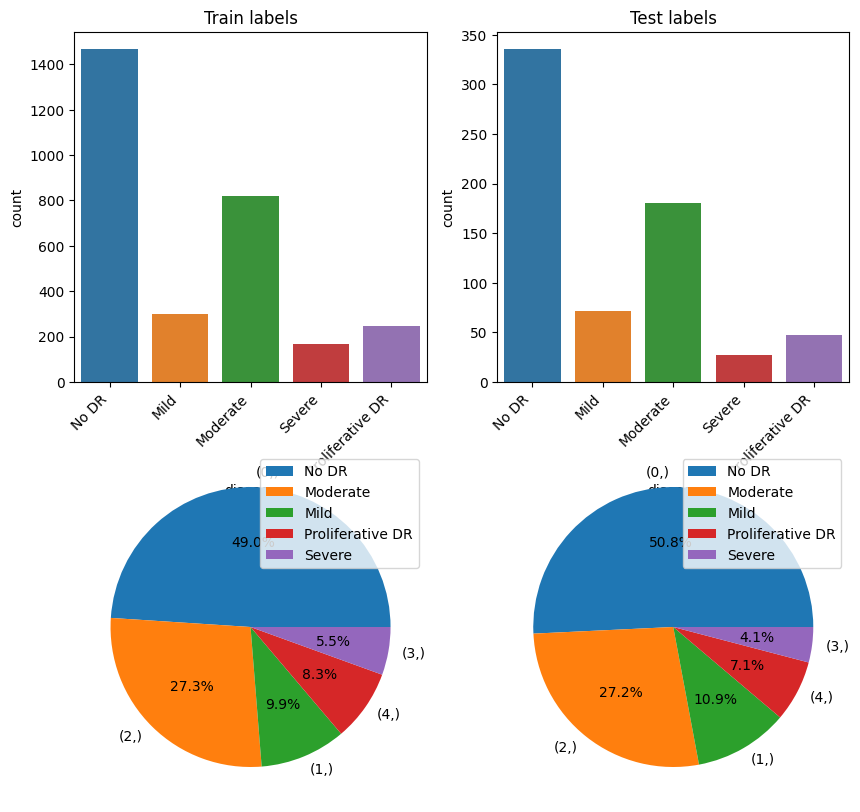

In [7]:
from sklearn.model_selection import train_test_split

DATASIZE = len(labels)
TRAIN_SIZE = 3000
TEST_SIZE = len(labels)-TRAIN_SIZE

fig,axes = plt.subplots(2,2)
fig.set_figheight(10)
fig.set_figwidth(10)

# Train-test split

imgs_train, imgs_test, labels_train, labels_test = train_test_split(images_resized, labels_np, test_size=TEST_SIZE,shuffle=True, random_state=SEED)

labels_train = pd.DataFrame(labels_train,columns=['disease'])
labels_test = pd.DataFrame(labels_test,columns=['disease'])

# count plot and pie plot of different class frequencies

ax = sns.countplot(data=labels_train ,x='disease', ax=axes[0][0])
ax.set_xticklabels([CLASS_NAMES[key] for key in CLASS_NAMES.keys()],rotation=45, ha="right")
ax.set_title("Train labels")
ax = sns.countplot(data=labels_test,x='disease', ax=axes[0][1])
ax.set_xticklabels([CLASS_NAMES[key] for key in CLASS_NAMES.keys()],rotation=45, ha="right")
ax.set_title("Test labels")
ax = labels_train.value_counts().plot(kind='pie', ax=axes[1][0],autopct='%1.1f%%', legend=True, ylabel='')
ax.legend(["No DR","Moderate", "Mild","Proliferative DR", "Severe"]);
ax = labels_test.value_counts().plot(kind='pie', ax=axes[1][1],autopct='%1.1f%%', legend=True, ylabel='')
ax.legend(["No DR","Moderate", "Mild","Proliferative DR", "Severe"]);

print(labels_train.value_counts())

labels_train = np.array(labels_train).reshape(-1)
labels_test = np.array(labels_test).reshape(-1)


**Furthermore, we can see some qualitative samples of the training and test splits after iamges are resized and size-normalized**

(3000, 300, 300, 3) (3000,)


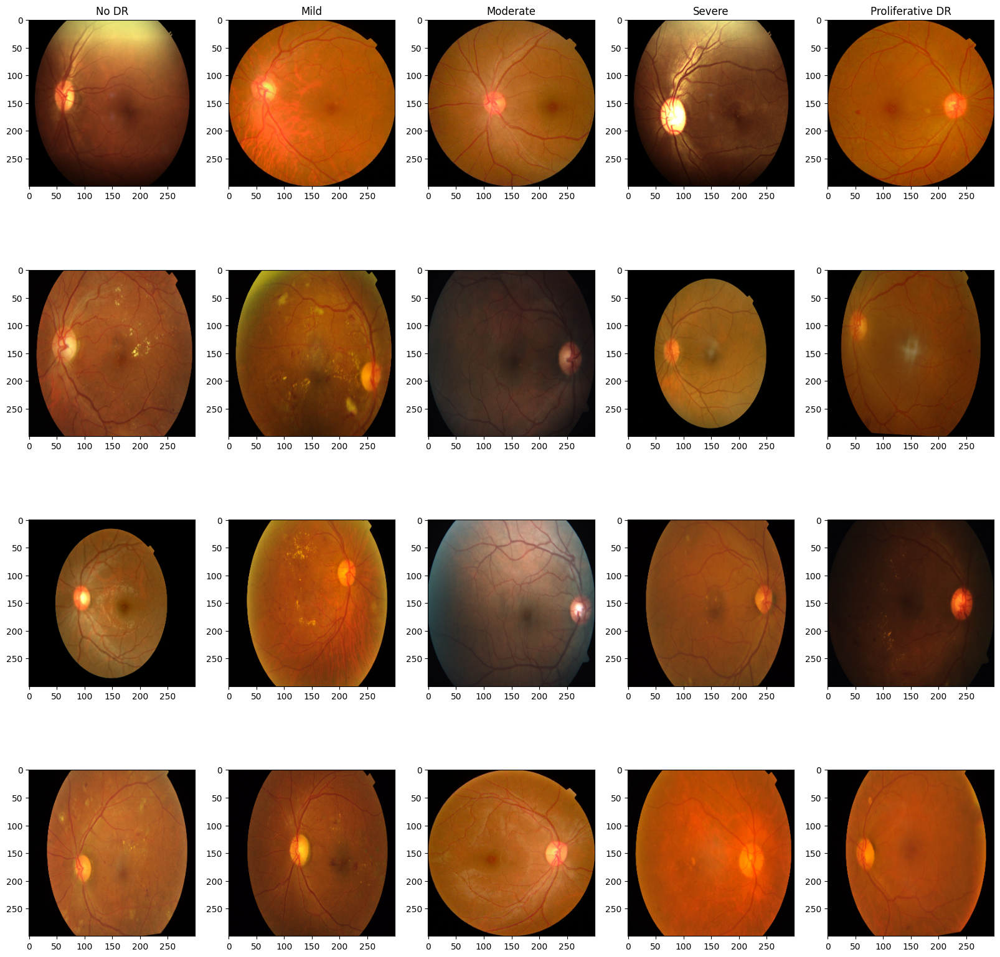

In [8]:
print(imgs_train.shape,labels_train.shape)
show_samples(imgs_train,labels_train,4)

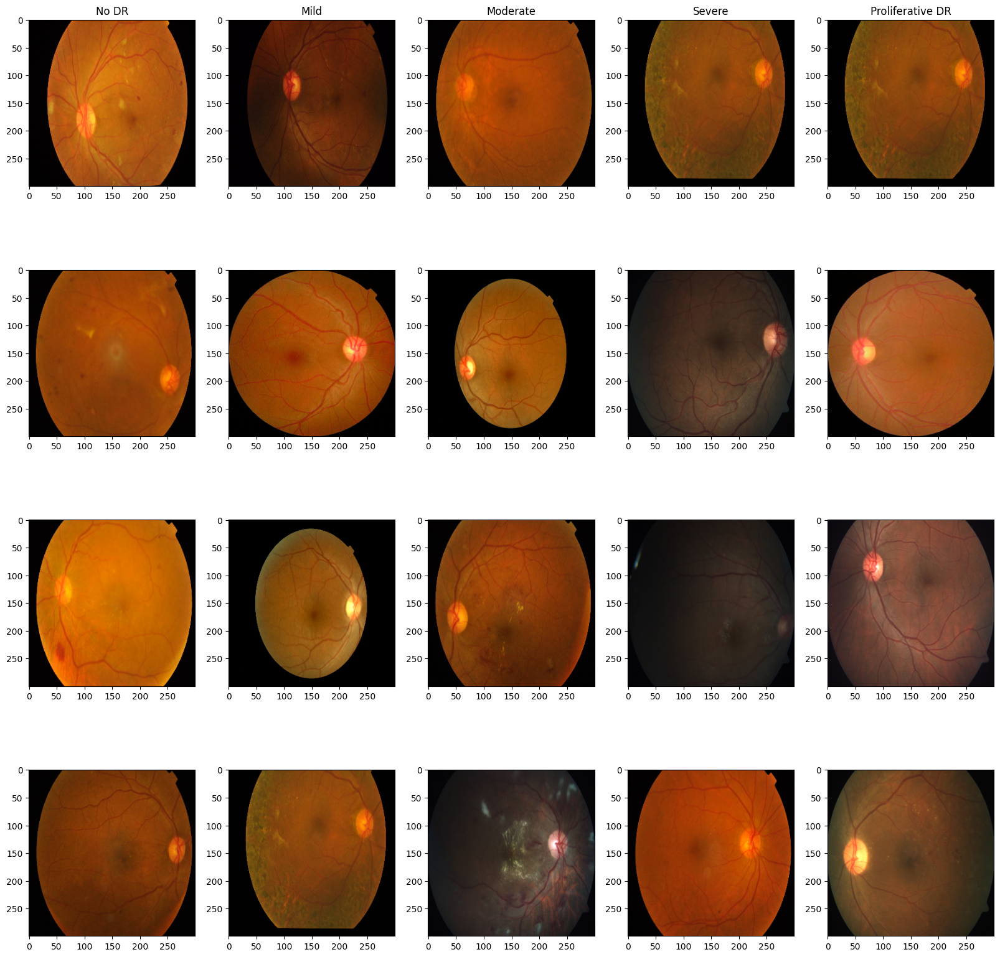

In [9]:
show_samples(imgs_test,labels_test,4)

**Since the number of training samples are reletively limited for an image classification task, we will augment the training dataset with new images by rotating, flipping, translating and brightness change of the images for better training  and generalization.**

In [136]:
#####################
# data augmentation
# we will add to training points by rotating, flipping, translating and brightness change of the images.
#####################

from scipy import ndimage
import matplotlib.pyplot as plt

#if weighted= True then it will oversample the less frequent classes    
#passes is the number of times the algorithm will consider each training sample
def augment(images_train,labels_train,passes,weighted=False):
    
    augmented_imgs,augmented_labels = [],[]
    for i in range(passes):
        for ii,img in enumerate(images_train):
            if(ii%200==0):
                print(i,ii)

            # Rotate the image randomly between (−30, 30)
            img = ndimage.rotate(img, random.randint(-30,30), reshape=True)
            
            #Horizontal and vertical flip for the images.
            if(random.random()<0.05):
                img = np.flipud(img)
            if(random.random()<0.05):
                img = np.fliplr(img)

            #Translation
            shift = random.randint(-30,30)
            img = np.roll(img, shift, axis=0)
            if(shift>=0):
                img[:shift,:,:]=0
            else:
                img[shift:,:,:]=0

            #change brightness
            hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            mask = gray_img > TOL
            hsv[:,:,2] = cv2.add(hsv[:,:,2], random.randint(-50,50))

            img = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)*mask[:,:,np.newaxis]
            
            img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
            
            #     if weighted= True then it will oversample the less frequent classes       
            if(weighted):
                if(labels_train[ii]==1 and random.random()<0.6):
                    augmented_imgs.append(img[np.newaxis,...])
                    augmented_labels.append(labels_train[ii])
                elif((labels_train[ii]==2  and random.random()<0.3) or (labels_train[ii]==3 and random.random()<0.8)):
                    augmented_imgs.append(img[np.newaxis,...])
                    augmented_labels.append(labels_train[ii])
                elif(labels_train[ii]==4 and random.random()<0.95):
                    augmented_imgs.append(img[np.newaxis,...])
                    augmented_labels.append(labels_train[ii])
            else: 
                augmented_imgs.append(img[np.newaxis,...])
                augmented_labels.append(labels_train[ii])
            
    augmented_imgs = np.concatenate(augmented_imgs, axis=0)
    augmented_labels = np.array(augmented_labels)
    
    return np.concatenate([images_train,augmented_imgs], axis=0), np.concatenate([labels_train,augmented_labels], axis=0)
    

In [27]:
imgs_train, labels_train = augment(imgs_train,labels_train,passes=1,weighted=False)
print(imgs_train.shape)

0 0
0 200
0 400
0 600
0 800
0 1000
0 1200
0 1400
0 1600
0 1800
0 2000
0 2200
0 2400
0 2600
0 2800
(6000, 300, 300, 3)


**Furthermore, we can see that in many of the images there is a dark margin around the retina imge, however the size of this margin varies between images and can add noise to the training process. As a result to achieve better results we will crop and removing such black margins by defining a mask.**

In [28]:
from PIL import Image

# this function will crop the black margin around the retina picture to reduce training  noise.
# First we will create a mask of the black regions around image and then crop it.
def crop_margin(images):
    
    TOL =7

    cropped_images= []
    for i in range(len(images)):

        # Image Cropping
        img = images[i]

        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img > TOL
        
        check_shape = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))].shape[0]
        if (check_shape == 0):  #image is too dark so that we crop out everything.
            print('image too dark')
            raise
        else:
            img1 = img[:, :, 0][np.ix_(mask.any(1), mask.any(0))]
            img2 = img[:, :, 1][np.ix_(mask.any(1), mask.any(0))]
            img3 = img[:, :, 2][np.ix_(mask.any(1), mask.any(0))]
            img = np.stack([img1, img2, img3], axis=-1)
        
        cropped_images.append(cv2.resize(img, (IMG_SIZE, IMG_SIZE))[np.newaxis,...])


    return np.concatenate(cropped_images, axis=0)



In [29]:
imgs_train = crop_margin(imgs_train)
imgs_test = crop_margin(imgs_test)
print(imgs_train.shape)

(6000, 300, 300, 3)


**Furthermore, we can also see that the luminance between iamges also varies a lot and this might also be another source for noisy training. As a result we need to perform several preprocessing stages to decrease noise and improve the quality of the images**

**We will perform the following steps as a preprocessing stage:**
    
**- To enhance luminosity of the images we will use Contrast Limited Adaptive Histogram Equalization (CLAHE). CLAHE is a popular method for enhancing the contrast of the fundus images, which has been used to improve the low contrast of medical images.  We apply CLAHE to the Luminance channel of the retina images in the LAB color space.**
**- After applying CLAHE method to improve luminance and contrast, this might cause some noise in the images. To mitigate that noise and normalize these images, we will apply Gaussian filter to the image.**

In [30]:
GAUSS_MEAN = (0,0)
GAUSS_STD = 30

## preprocessing stages:
## 1- Apply CLAHE to L channel of LAB color space
## 2- Use gaussian filter to reduce noise. I used std of 30

def preprocess(images):
    images_list = []
    for i in range(len(images)):
        if(i%500==0):
            print(i)
        # rgb to lab
        lab_img = cv2.cvtColor(images[i], cv2.COLOR_RGB2LAB)
        l_channel,a_channel,b_channel = lab_img[:,:,0],lab_img[:,:,1],lab_img[:,:,2]

        #apply CLAHE
        clahe = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))

        l_channel = clahe.apply(l_channel)
        lab_img = np.concatenate((l_channel[:,:,np.newaxis],a_channel[:,:,np.newaxis],b_channel[:,:,np.newaxis]), axis=2)

        img = cv2.cvtColor(lab_img, cv2.COLOR_LAB2RGB)

        #gaussian kernel
        img = cv2.addWeighted(images[i], 3, cv2.GaussianBlur(img, GAUSS_MEAN, GAUSS_STD), -3, 128)
        
        images_list.append(img)
        
    images = np.stack(images_list, axis=3)
    images = np.transpose(images,(3,0,1,2))
    return images


In [31]:
imgs_train = preprocess(imgs_train)
imgs_test = preprocess(imgs_test)

0
500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
0
500


**These are some sample images after preprocessing. As we can see after preprocessing, the features corresponding to areas around blood veins as well as some spots are more emphasized which is beneficial for training. Furthermore we will also mean-std normalize the training images.**

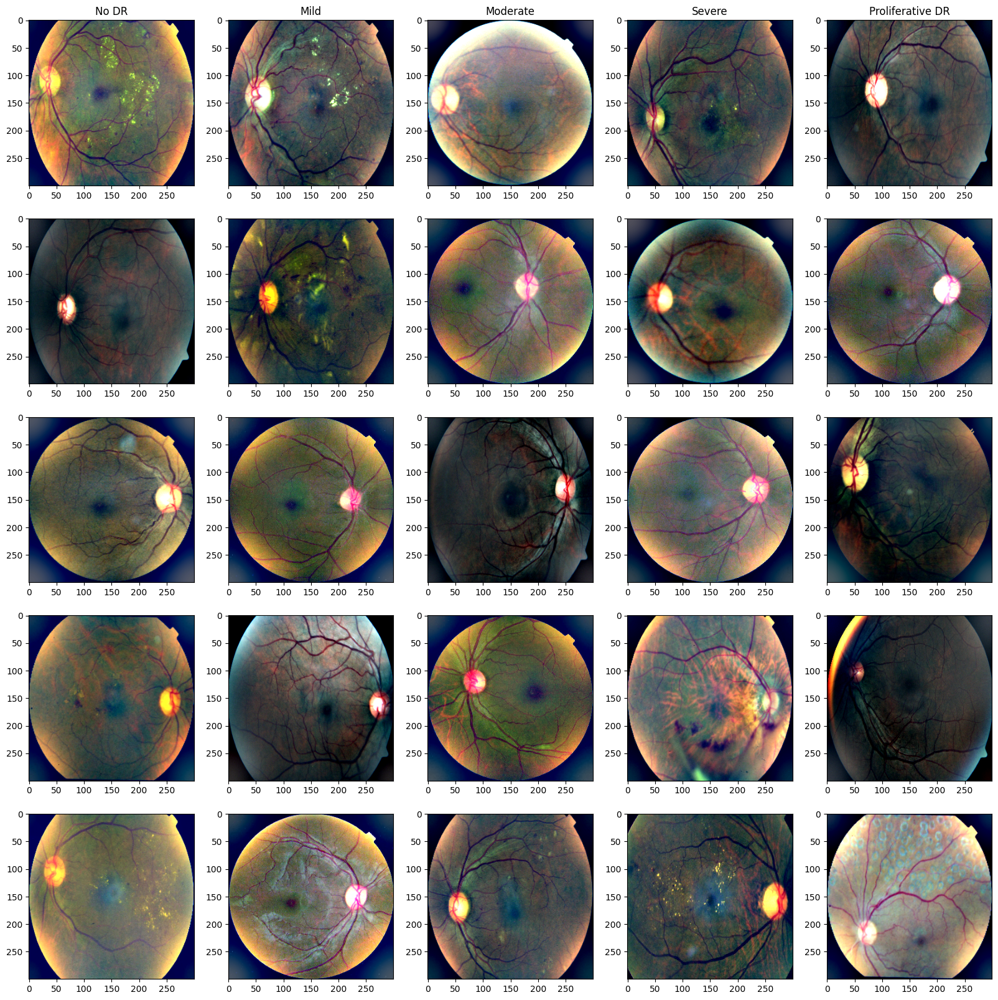

In [32]:
show_samples(imgs_train,labels_train,5)

In [33]:
from torch.nn.functional import normalize

#normalizing images by training mean and standard deviation

train_mean = imgs_train.mean(axis=(0, 1, 2), keepdims=True)
train_std = imgs_test.mean(axis=(0, 1, 2), keepdims=True)

X_train = (imgs_train - train_mean) / train_std
X_test = (imgs_test - train_mean) / train_std

**Now that the data is preprocessed and ready it is time to select a model for training. We will use a popular deep learning model for this challenge:  EfficientNet. This model has been extensively applied to medical image classification with promising results and is one of the famous models for medical image classification. We will use the pretrained models and add final layers on the top to fine tune them for our specific task.  We also ran some preliminary experiments with InceptionNet-v3 but the performance was not as good so we chose  EfficientNet for our project.**

In [35]:
from skimage import io, color
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pickle
import torch
import torch.nn as nn
import torch.nn.functional as F
from efficientnet_pytorch import EfficientNet
import pandas as pd
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import gc

In [70]:
#####################
#model training
#EfficientNetB0


X_train = torch.Tensor(imgs_train)  # transform to torch tensor
Y_train = torch.Tensor(labels_train).reshape(-1)
X_test = torch.Tensor(imgs_test)
Y_test = torch.Tensor(labels_test).reshape(-1)

TRAIN_SIZE = 5000
print(X_train.shape,Y_train.shape)

Train_Bsize = 32
Test_Bsize = 16

#Train validation split
# creating dataloaders for datasets
train_dataset = TensorDataset(X_train[:TRAIN_SIZE,...], Y_train[:TRAIN_SIZE,...])
train_dataloader = DataLoader(train_dataset,batch_size=Train_Bsize,shuffle=True)
val_dataset = TensorDataset(X_train[TRAIN_SIZE:,...], Y_train[TRAIN_SIZE:,...])
val_dataloader = DataLoader(val_dataset,batch_size=Test_Bsize,shuffle=True)

test_dataset = TensorDataset(X_test, Y_test)
test_dataloader = DataLoader(test_dataset,batch_size=Test_Bsize,shuffle=True)


torch.Size([6000, 300, 300, 3]) torch.Size([6000])


In [72]:
# pretrained EfficientNet model with FC layers for fine-tuning
class EN_retinaClassifier(nn.Module):
    def __init__(self):
        super(EN_retinaClassifier, self).__init__()

        self.efficientNet = EfficientNet.from_pretrained('efficientnet-b0')
        self.FC1 = nn.Linear(in_features=1000, out_features=500)
        self.FC2 = nn.Linear(in_features=500, out_features=100)
        self.FC3 = nn.Linear(in_features=100, out_features=5)

    def forward(self, x):

        x = self.efficientNet(x)

        x = self.FC1(x)
        x = F.relu(x)
        x = self.FC2(x)
        x = F.relu(x)
        x = self.FC3(x)

        return x


In [132]:
from torchvision import models

# pretrained Inception net-v3 model with FC layers for fine-tuning
# preliminary experiments were also done with Inceptionnetv3 but the model did not perform as well as Efficientnet

class INv3_retinaClassifier(nn.Module):
    def __init__(self):
        super(INv3_retinaClassifier, self).__init__()

        self.inceptionNet = models.inception_v3(pretrained=True)
        self.AvgPool = nn.AvgPool1d(3, stride=2)
        self.FC1 = nn.Linear(in_features=1000, out_features=500)
        self.FC2 = nn.Linear(in_features=500, out_features=100)
        self.FC3 = nn.Linear(in_features=100, out_features=5)

    def forward(self, x):

        x, aux = self.inceptionNet(x)
        print(x.shape)
        raise
        x = self.AvgPool(x)
        x = self.FC1(x)
        x = F.relu(x)
        x = self.FC2(x)
        x = F.relu(x)
        x = self.FC3(x)

        return x


In [155]:
def train(model,optimizer,train_dataloader,val_loader,epochs):
    
    #use cross-entropy losss for classification
    criterion = nn.CrossEntropyLoss()
    
    train_losses,train_accs = [],[]
    val_losses,val_accs = [],[]

    #main training loop
    for epoch in range(epochs):

        running_loss = 0.0
        running_acc = 0.0

        model.train()
        for i, data in enumerate(train_dataloader):

            imgs, labels = data
            imgs, labels = imgs.permute(0, 3, 1, 2).to(device), labels.long().to(device)

            outputs = model(imgs)
            optimizer.zero_grad()

            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            #computing accuracy
            np_pred = np.argmax(outputs.detach().cpu().numpy(),-1)
            np_gt = labels.detach().cpu().numpy()
            running_acc += np.sum(np_pred == np_gt)
            

        #saving these for visualizaiton purposes
        train_losses.append(running_loss)
        train_accs.append(running_acc/TRAIN_SIZE)
        print("[Epoch {:2d} - training loss: {:.3f} acc: {:.3f}".format(epoch + 1, running_loss, running_acc/TRAIN_SIZE))

        running_loss = 0.0
        running_acc = 0.0

        #evaluating the model on validation set
        model.eval()
        for i, data in enumerate(val_dataloader):
            # get the inputs; data is a list of [inputs, labels]
            imgs, labels = data
            imgs, labels = imgs.permute(0, 3, 1, 2).to(device), labels.long().to(device)

            outputs = model(imgs)
            loss = criterion(outputs, labels)

            running_loss += loss.item()

            np_pred = np.argmax(outputs.detach().cpu().numpy(),-1)
            np_gt = labels.detach().cpu().numpy()
            running_acc += np.sum(np_pred == np_gt)

        val_losses.append(running_loss)
        val_accs.append(running_acc/1000)
        print("[Epoch {:2d} - validation loss: {:.3f} acc: {:.3f}".format(epoch + 1, running_loss, running_acc/1000))

        torch.save({
            'epoch': i,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            }, file_dir+'../'+model.name+'chckpoint'+str(i)+'.pth')
        
    return (train_losses,train_accs,val_losses,val_accs)


In [133]:

if torch.cuda.is_available():
    device = 'cuda:0'
else:
    device = 'cpu'

#instantiating Efficient net model
EN_model = EN_retinaClassifier()
EN_model = EN_model.to(device)
EN_model.name = 'EN_model'

#instantiating InceptionNet net model

# some initial experiments were also explored with incepiton net model however since the results were not as good 
#as efficientNet I did not include them
INv3_model = INv3_retinaClassifier()
INv3_model = INv3_model.to(device)
INv3_model.name = 'INv3_model'

#instantiating optimizets to SGD+momentum
EN_optimizer = optim.SGD(EN_model.parameters(), lr=0.001, momentum=0.9)
INv3_optimizer = optim.SGD(INv3_model.parameters(), lr=0.001, momentum=0.9)



Loaded pretrained weights for efficientnet-b0


In [76]:
(train_losses,train_accs,val_losses,val_accs) = train(EN_model,EN_optimizer,train_dataloader,val_dataloader,30)

[Epoch  1 - training loss: 188.378 acc: 0.543
[Epoch  1 - validation loss: 63.636 acc: 0.593
[Epoch  2 - training loss: 129.848 acc: 0.705
[Epoch  2 - validation loss: 49.653 acc: 0.715
[Epoch  3 - training loss: 116.983 acc: 0.726
[Epoch  3 - validation loss: 46.468 acc: 0.724
[Epoch  4 - training loss: 109.101 acc: 0.737
[Epoch  4 - validation loss: 44.188 acc: 0.730
[Epoch  5 - training loss: 103.421 acc: 0.739
[Epoch  5 - validation loss: 40.969 acc: 0.737
[Epoch  6 - training loss: 95.544 acc: 0.758
[Epoch  6 - validation loss: 38.070 acc: 0.750
[Epoch  7 - training loss: 88.938 acc: 0.771
[Epoch  7 - validation loss: 37.468 acc: 0.766
[Epoch  8 - training loss: 82.456 acc: 0.792
[Epoch  8 - validation loss: 35.020 acc: 0.786
[Epoch  9 - training loss: 77.280 acc: 0.806
[Epoch  9 - validation loss: 34.410 acc: 0.790
[Epoch 10 - training loss: 72.122 acc: 0.823
[Epoch 10 - validation loss: 35.274 acc: 0.790
[Epoch 11 - training loss: 65.261 acc: 0.834
[Epoch 11 - validation loss: 3

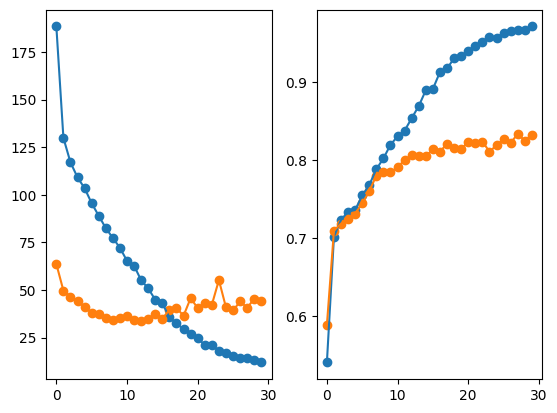

In [87]:
#visualizing training and validation loss

fig,axes = plt.subplots(1,2)
axes[0].scatter(list(range(30)),train_losses)
axes[0].plot(list(range(30)), train_losses)
axes[0].scatter(list(range(30)),val_losses)
axes[0].plot(list(range(30)), val_losses)

#visualizing training and validation accuracy

axes[1].scatter(list(range(30)),train_accs)
axes[1].plot(list(range(30)), train_accs)
axes[1].scatter(list(range(30)),val_accs)
axes[1].plot(list(range(30)), val_accs)
plt.show()

**As we can see the validation loss (orange curve) is hitting a platue after around 25-30 epochs. (Blue curve is training and orange is validation). The curve on the left is loss while the curve on the right is accuray**

In [99]:
from sklearn.metrics import confusion_matrix  
from sklearn.metrics import precision_score, \
    recall_score, confusion_matrix, classification_report, \
    accuracy_score, f1_score

acc=0.0
cf_matrix=0.0

criterion = nn.CrossEntropyLoss()

EN_model.eval()
gts,preds,probs=[],[],[]

#evaluating our mdoel on the test set
for i, data in enumerate(test_dataloader):

    imgs, labels = data
    imgs, labels = imgs.permute(0, 3, 1, 2).to(device), labels.long().to(device)

    outputs = EN_model(imgs)
    loss = criterion(outputs, labels)

    np_pred = np.argmax(outputs.detach().cpu().numpy(),-1)
    np_pred_prob = outputs.detach().cpu().numpy()
    
    np_gt = labels.detach().cpu().numpy()
    acc += np.sum(np_pred == np_gt)
    gts.append(np_gt)
    preds.append(np_pred)
    probs.append(np_pred_prob)

gts = np.hstack(gts).reshape(-1)
preds = np.hstack(preds).reshape(-1)
probs = np.vstack(probs)
cf_matrix = confusion_matrix(np.hstack(gts).reshape(-1), np.hstack(preds).reshape(-1))

#classification metrics
print ('Accuracy:', accuracy_score(gts, preds))
print ('F1 score:', f1_score(gts, preds, average='micro'))
print ('F1 score:', f1_score(gts, preds, average='macro'))

print ('Recall:', recall_score(gts, preds, average='micro'))
print ('Precision:', precision_score(gts, preds, average='micro'))
print ('\n clasification report:\n', classification_report(gts,preds))
print ('\n confussion matrix:\n',confusion_matrix(gts, preds))



Accuracy: 0.8293051359516617
F1 score: 0.8293051359516617
F1 score: 0.650266845722514
Recall: 0.8293051359516617
Precision: 0.8293051359516617

 clasification report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       336
           1       0.71      0.50      0.59        72
           2       0.73      0.79      0.76       180
           3       0.28      0.33      0.31        27
           4       0.64      0.60      0.62        47

    accuracy                           0.83       662
   macro avg       0.67      0.64      0.65       662
weighted avg       0.83      0.83      0.83       662


 confussion matrix:
 [[334   2   0   0   0]
 [  5  36  30   0   1]
 [  1  12 142  14  11]
 [  0   0  14   9   4]
 [  0   1   9   9  28]]


**Our model is able to achieve 83% accuracy in a 5 class problem with macro-averaged F1 score 0.65. By looking at the confusion matrix we notice that many of the missclassified cases correspond to close classes. For instance "moderate blindness" is sometimes claassified as "mild blindness" or "severe blindness" and vice versa for some images. In other words, most of the failcases of our model are for when the images might be on the border of two classes (e.g. moderate/severe) and the model might confuse such cases for some images.**

**Furthermore, if we plot the micro-averaged ROC curve we can see that our model is able to achieve AUC = 0.97.**

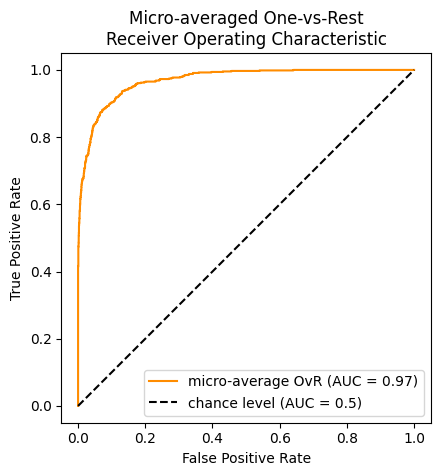

In [102]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import RocCurveDisplay

#visualizing ROC curve
label_binarizer = LabelBinarizer().fit(gts)
gts = np.hstack(gts).reshape(-1)
# probs = np.vstack(probs)
gts_onehot = label_binarizer.transform(gts)

# clf, X_test, y_test
RocCurveDisplay.from_predictions(
    gts_onehot.ravel(),
    probs.ravel(),
    name="micro-average OvR",
    color="darkorange",
)

plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Micro-averaged One-vs-Rest\nReceiver Operating Characteristic")
plt.legend()
plt.show()

**We can see that although our model achieves good AUC score and accuracy, there are still rooms for improvement. As mentioned before, many of the misclassificaitons are for close classes with lower number of samples. In other words the mdoel probably has not seen enough samples of some classes to be able to classify them correctly. In order to fix this we will oversample classes with lower frrequencie. (Weighted= True). Oversampling is also combined with augmentatiaon so new training points are added to help training.**

In [137]:
# data augmentation and oversampling
imgs_train_augmented, labels_train_augmented = augment(imgs_train,labels_train,passes=2,weighted=True)
print(imgs_train_augmented.shape,labels_train_augmented.shape)

0 0
0 200
0 400
0 600
0 800
0 1000
0 1200
0 1400
0 1600
0 1800
0 2000
0 2200
0 2400
0 2600
0 2800
0 3000
0 3200
0 3400
0 3600
0 3800
0 4000
0 4200
0 4400
0 4600
0 4800
0 5000
0 5200
0 5400
0 5600
0 5800
1 0
1 200
1 400
1 600
1 800
1 1000
1 1200
1 1400
1 1600
1 1800
1 2000
1 2200
1 2400
1 2600
1 2800
1 3000
1 3200
1 3400
1 3600
1 3800
1 4000
1 4200
1 4400
1 4600
1 4800
1 5000
1 5200
1 5400
1 5600
1 5800
(9155, 300, 300, 3) (9155,)


**Now if we look at the pie chart we can see that the class frequencies are mroe balanced.**

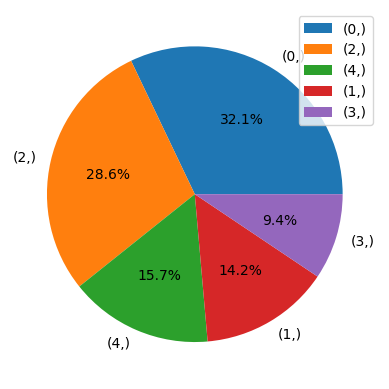

In [160]:
ax = pd.DataFrame(labels_train_augmented,columns=['disease']).value_counts().plot(kind='pie',autopct='%1.1f%%', legend=True, ylabel='')

**We continue to train the model on this oversampled dataset**

In [163]:
print(imgs_train_augmented.shape)
train_oversampled_dataset = TensorDataset(torch.Tensor(imgs_train_augmented), torch.Tensor(labels_train_augmented).reshape(-1))
train_oversampled_dataloader = DataLoader(train_oversampled_dataset,batch_size=Train_Bsize,shuffle=True)

(train_oversampled_losses,train_oversampled_accs,val_oversampled_losses,val_oversampled_accs) = train(EN_model,EN_optimizer,train_oversampled_dataloader,val_dataloader,3)

(9155, 300, 300, 3)


In [161]:
from sklearn.metrics import confusion_matrix  
from sklearn.metrics import precision_score, \
    recall_score, confusion_matrix, classification_report, \
    accuracy_score, f1_score

acc=0.0
cf_matrix=0.0

criterion = nn.CrossEntropyLoss()

EN_model.eval()
gts,preds,probs=[],[],[]
for i, data in enumerate(test_dataloader):
#     print(i)
    imgs, labels = data
    imgs, labels = imgs.permute(0, 3, 1, 2).to(device), labels.long().to(device)

    outputs = EN_model(imgs)
    loss = criterion(outputs, labels)

    np_pred = np.argmax(outputs.detach().cpu().numpy(),-1)
    np_pred_prob = outputs.detach().cpu().numpy()
    
    np_gt = labels.detach().cpu().numpy()
    acc += np.sum(np_pred == np_gt)
    gts.append(np_gt)
    preds.append(np_pred)
    probs.append(np_pred_prob)

gts = np.hstack(gts).reshape(-1)
preds = np.hstack(preds).reshape(-1)
probs = np.vstack(probs)
cf_matrix = confusion_matrix(np.hstack(gts).reshape(-1), np.hstack(preds).reshape(-1))

print ('Accuracy:', accuracy_score(gts, preds))
print ('F1 score:', f1_score(gts, preds, average='micro'))
print ('F1 score:', f1_score(gts, preds, average='macro'))

print ('Recall:', recall_score(gts, preds, average='micro'))
print ('Precision:', precision_score(gts, preds, average='micro'))
print ('\n clasification report:\n', classification_report(gts,preds))
print ('\n confussion matrix:\n',confusion_matrix(gts, preds))

Accuracy: 0.8534743202416919
F1 score: 0.8534743202416919
F1 score: 0.7114889386943457
Recall: 0.8534743202416919
Precision: 0.8534743202416919

 clasification report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       336
           1       0.64      0.65      0.65        72
           2       0.78      0.80      0.79       180
           3       0.44      0.44      0.44        27
           4       0.78      0.62      0.69        47

    accuracy                           0.85       662
   macro avg       0.73      0.70      0.71       662
weighted avg       0.85      0.85      0.85       662


 confussion matrix:
 [[333   3   0   0   0]
 [  6  47  18   0   1]
 [  1  22 144  10   3]
 [  0   0  11  12   4]
 [  0   1  12   5  29]]


**As we can see the accuract has increased from 82% to 85% and more importantly the macro average F1 score is increased from 0.65 to 0.73, improving class by class precision, recall and F1 scores.**

# Summary

**Author:** [Sepehr Janghorbani](https://www.janghorbani.com/)

**In this notebook I used the dataset for Aptos 2019 retina classification challenge to train a retina image classifier. First I performed exploratory data analysis. By looking at images I came to the conclusion that preprocessing should include CLAHE, Gaussian filters and cropping in order to imrpve th contrast and quality of the images hwile reducing image noise Furthermore I investigated two models EfficientNet and InceptionNet for our training and was able to reach 83% accuracy and 0.97 AUC for EfficientNet. After careful consideration of the fail casesI came to the conclusion that the fail cases are mostly underrepresnted in the training set and by oversampling and augmenting the dataset with new images I was able to improve accuracy, and macro- averaged F1 metrics to 85% and 0.71.**

**Further improvements can be achieved with more advanced and more aggressive oversampling as well as using an ensemble of models.**

